# Introduction

Setting up the environment for the project to be run.

In [1]:
!nvidia-smi

Sat Mar  8 16:06:39 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P0             26W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install -q gdown inference-gpu
!pip install -q git+https://github.com/roboflow/sports.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 8.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 999.6/999.6 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 50.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 66.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.9/891.9 kB 45.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 774.7/774.7 kB 42.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
!gdown -O "121364_0.mp4" "https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu"

Downloading...
From: https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu
To: /kaggle/working/121364_0.mp4
100%|███████████████████████████████████████| 17.2M/17.2M [00:00<00:00, 218MB/s]


In [4]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"  

In [82]:
import io
import sys
import cv2
import umap
import torch
import numpy as np
import supervision as sv

from inference import get_model
from kaggle_secrets import UserSecretsClient
from google.colab import userdata 
from tqdm import tqdm
from more_itertools import chunked
from sklearn.cluster import KMeans
from typing import Optional
from transformers import AutoProcessor, SiglipVisionModel
from sports.common.team import TeamClassifier
from sports.common.view import ViewTransformer
from sports.configs.soccer import SoccerPitchConfiguration
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_paths_on_pitch,
    draw_pitch_voronoi_diagram
)

In [6]:
SOURCE_VIDEO_PATH = "/kaggle/working/121364_0.mp4"
TARGET_VIDEO_PATH = "/kaggle/working/121364_0_result.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3
STRIDE = 30

In [97]:
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17, outline_thickness=1
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_scale=0.2,
    text_thickness=1,
    text_padding=3,
    text_position=sv.Position.BOTTOM_CENTER
)


In [98]:
user_secrets = UserSecretsClient()
ROBOFLOW_API_KEY = user_secrets.get_secret("Roboflow")

# Object Detection & Team Classification

## Load Detection Model

In [8]:
DETECTION_MODEL_ID = "football-detection-ysgxf/3"
DETECTION_MODEL = get_model(
    model_id=DETECTION_MODEL_ID, 
    api_key=ROBOFLOW_API_KEY
)

## Load Classification Model

In [9]:
SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.40M [00:00<?, ?B/s]

### Using the detection model I have trained, fine-tune the pre-trained detection model

In [10]:
def extract_crops(source_video_path: str):
    # Stride to skip every 29 frames and get the 30th one
    frame_generator = sv.get_video_frames_generator(source_path=source_video_path, stride=STRIDE)
    crops = []
    for frame_sample in tqdm(frame_generator, desc='Collecting crops'):
        result = DETECTION_MODEL.infer(frame_sample, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)
        detections = detections.with_nms(threshold=0.5, class_agnostic=True)
        detections = detections[detections.class_id == PLAYER_ID]
        crops += [
            sv.crop_image(frame_sample, xyxy) 
            for xyxy in detections.xyxy
        ]
    return crops

Number of crops: 478


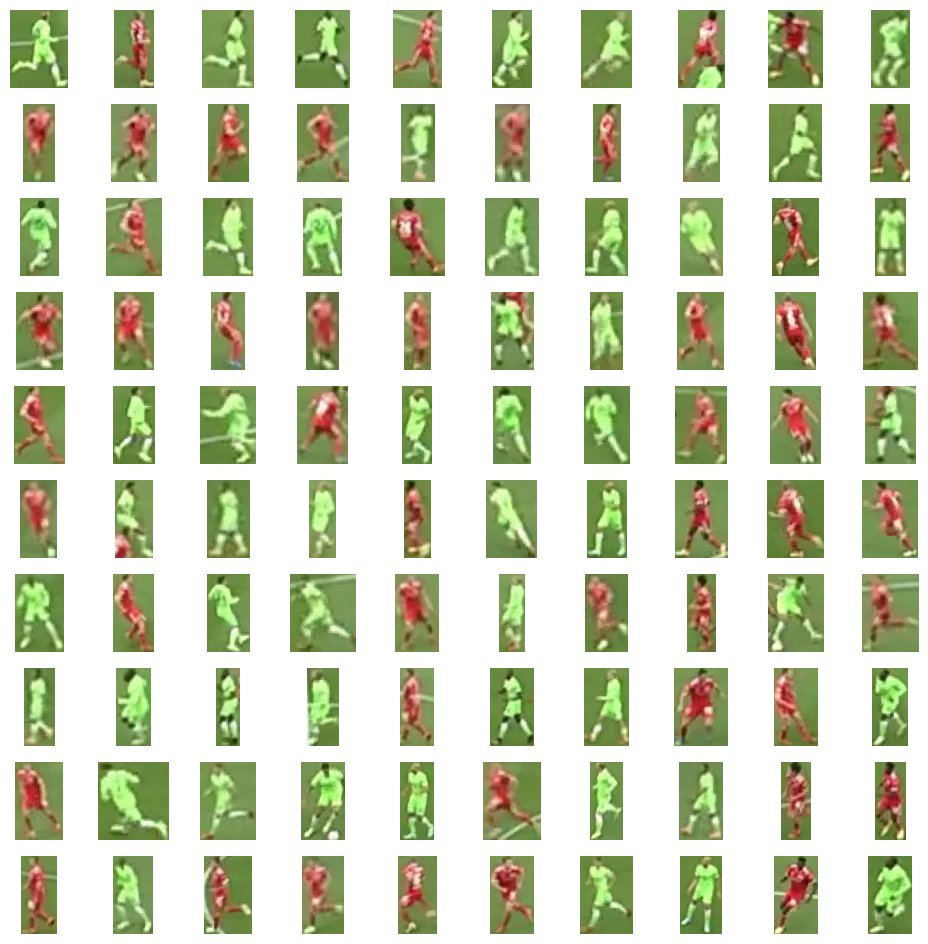

In [11]:
crops = extract_crops(SOURCE_VIDEO_PATH)
print('Number of crops:', len(crops))
sv.plot_images_grid(crops[:100], grid_size=[10,10])

In [12]:
BATCH_SIZE = 32
# Convert from numpy arrays (OpenCV) to Pillow images for SigLIP Model
crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = list(chunked(crops, BATCH_SIZE))
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='Embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)
print('Embeddings shape:', data.shape)

Embedding extraction: 100%|██████████| 15/15 [00:04<00:00,  3.57it/s]

Embeddings shape: (478, 768)


In [13]:
REDUCER = umap.UMAP(n_components=3)  # Reduce to 3D space
CLUSTERING_MODEL = KMeans(n_clusters=2)
projections = REDUCER.fit_transform(data)
print('Projections shape:', projections.shape)

Projections shape: (478, 3)


In [14]:
clusters = CLUSTERING_MODEL.fit_predict(projections)
print('Clusters:', clusters)

Clusters: [0 1 0 0 1 0 0 1 1 0 1 1 1 1 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0
 1 1 1 1 0 0 1 0 0 0 1 1 0 1 0 0 0 1 0 0 1 1 1 0 1 0 0 1 0 1 1 0 1 0 0 0 0
 1 0 0 1 1 0 1 0 0 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 1 0 1 0 1 1 1 0 0 0 0 1 1
 1 1 0 0 1 1 0 0 0 1 0 1 1 1 1 0 0 0 1 1 0 1 0 1 1 1 1 0 1 0 0 0 0 1 0 1 0
 1 0 1 1 0 0 1 0 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 0 0 1 0 1 1 1 1 0 1 0 1
 0 0 0 1 1 0 1 0 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 0 1 1
 1 0 1 0 0 1 0 1 1 1 0 0 0 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 0 1 0 0 1 1 0
 1 1 1 0 1 1 0 1 0 0 1 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 1 0 1 0 1 0 0 0 0
 0 1 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 1 1 0 1 0 0 1 1 0 1 1 1 0 1 1 0 0 0 0 0
 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1 1 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 0 1 1 0 0
 0 0 1 0 1 1 1 1 1 0 1 0 1 1 0 0 0 1 0 1 1 0 0 1 1 0 0 0 1 1 1 1 0 0 1 0 0
 1 0 0 1 1 0 0 1 0 1 1 1 1 0 0 1 0 0 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 1
 0 0 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 1 0 0 0 0 1 1 0 0 1 0]


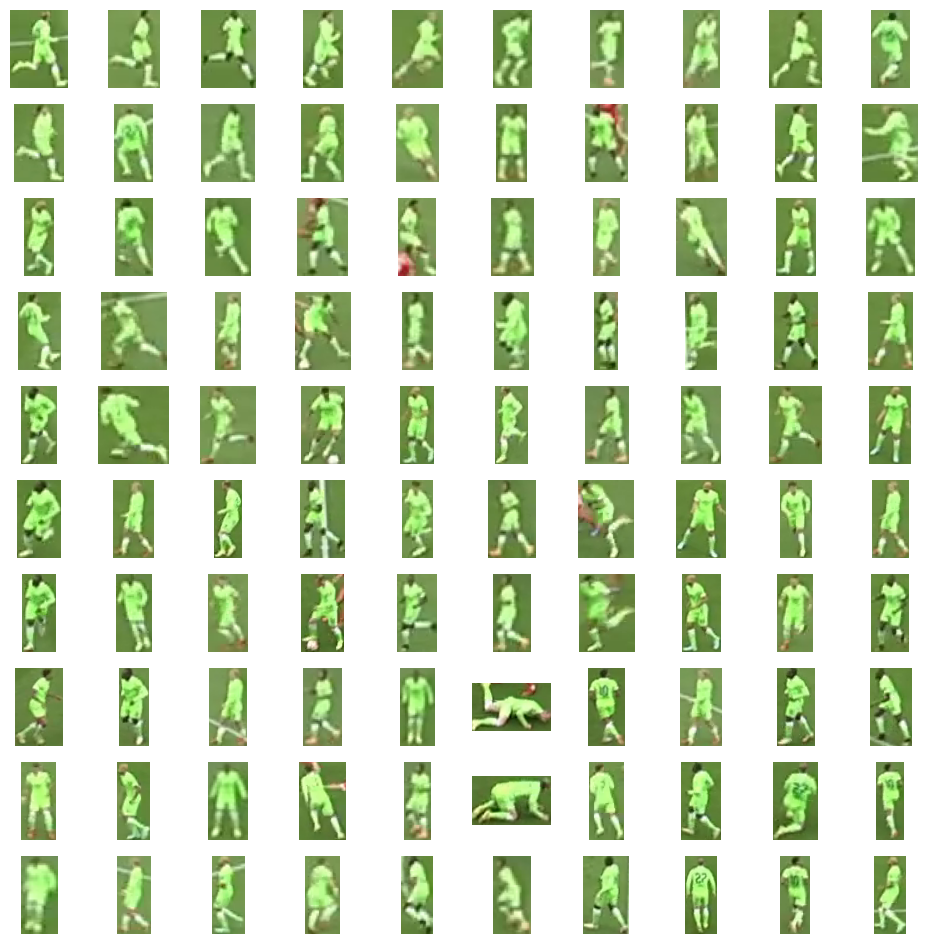

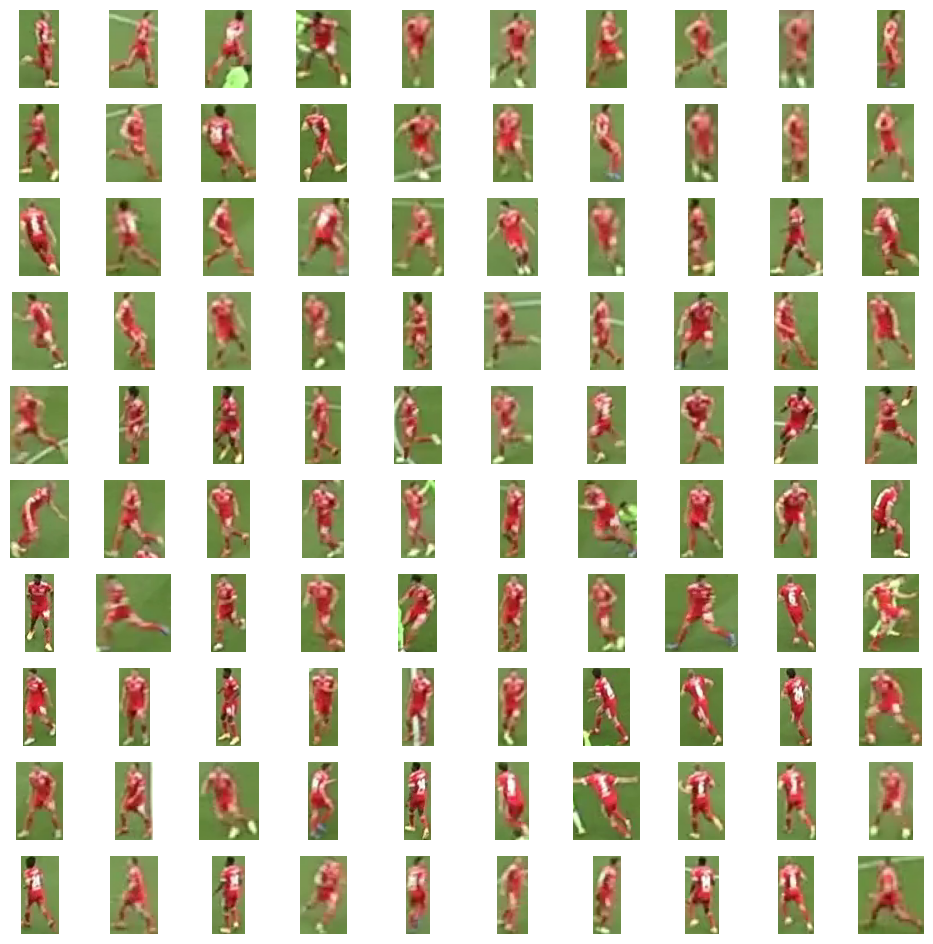

In [15]:
team_0 = [crop for crop, cluster in zip(crops, clusters) if cluster == 0]
team_1 = [crop for crop, cluster in zip(crops, clusters) if cluster == 1]
sv.plot_images_grid(team_0[:100], grid_size=[10,10])
sv.plot_images_grid(team_1[:100], grid_size=[10,10])

In [16]:
frame_generator = sv.get_video_frames_generator(source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='Collecting crops for team classification'):
    result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device="cuda")
team_classifier.fit(crops)

Embedding extraction: 18it [00:04,  3.93it/s]


In [17]:
def resolve_goalkeepers_team_id(players: sv.Detections, goalkeepers: sv.Detections) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

Embedding extraction: 1it [00:00,  6.54it/s]


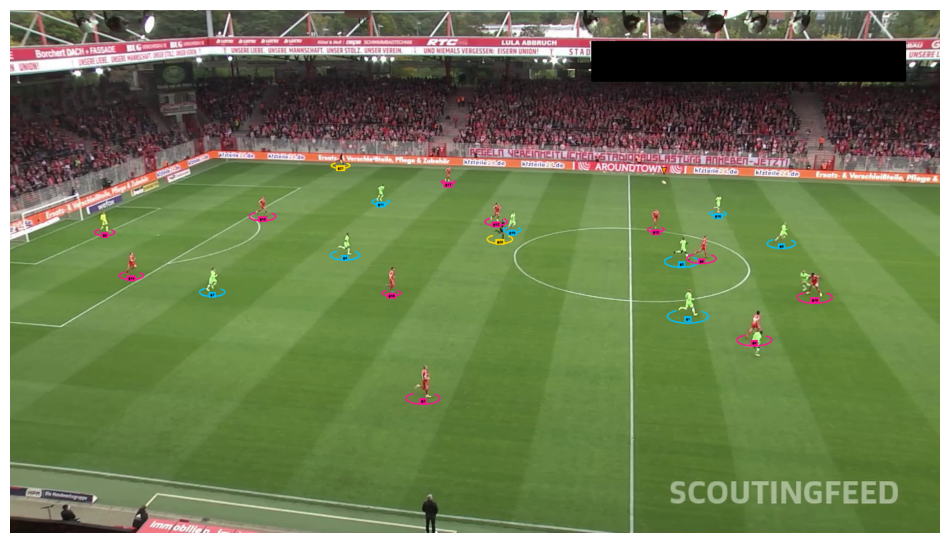

In [18]:
tracker = sv.ByteTrack()
tracker.reset()

# Process one frame for annotation
frame = next(sv.get_video_frames_generator(SOURCE_VIDEO_PATH))
result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
other_detections = detections[detections.class_id != BALL_ID]

ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)
other_detections = other_detections.with_nms(threshold=0.5, class_agnostic=True)
other_detections = tracker.update_with_detections(detections=other_detections)

goalkeepers_detections = other_detections[other_detections.class_id == GOALKEEPER_ID]
players_detections = other_detections[other_detections.class_id == PLAYER_ID]
referees_detections = other_detections[other_detections.class_id == REFEREE_ID]

player_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(player_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

other_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections
])

labels = [f"#{tracker_id}" for tracker_id in other_detections.tracker_id]
other_detections.class_id = other_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=other_detections)
annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=other_detections, labels=labels)

sv.plot_image(annotated_frame)

In [ ]:
tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_sink = sv.VideoSink(TARGET_VIDEO_PATH, video_info=video_info)

with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):
        result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)
        
        ball_detections = detections[detections.class_id == BALL_ID]
        other_detections = detections[detections.class_id != BALL_ID]
        
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)
        other_detections = other_detections.with_nms(threshold=0.5, class_agnostic=True)
        other_detections = tracker.update_with_detections(detections=other_detections)
        
        goalkeepers_detections = other_detections[other_detections.class_id == GOALKEEPER_ID]
        players_detections = other_detections[other_detections.class_id == PLAYER_ID]
        referees_detections = other_detections[other_detections.class_id == REFEREE_ID]
        
        player_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
        players_detections.class_id = team_classifier.predict(player_crops)
        
        goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
            players_detections, goalkeepers_detections
        )
        
        referees_detections.class_id -= 1
        
        other_detections = sv.Detections.merge([
            players_detections, goalkeepers_detections, referees_detections
        ])
        
        other_detections.class_id = other_detections.class_id.astype(int)
        
        labels = [
            f"#{tracker_id}"
            for tracker_id in other_detections.tracker_id
        ]
        
        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=other_detections)
        annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
        annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=other_detections, labels=labels)
        video_sink.write_frame(annotated_frame)

sv.plot_image(annotated_frame)

In [20]:
FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi-jufj9/1"
FIELD_DETECTION_MODEL = get_model(model_id=FIELD_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

In [ ]:
# transformer = ViewTransformer(
#     source=frame_reference_points,
#     target=pitch_reference_points
# )

# transformer_inverse = ViewTransformer(
#     source=pitch_reference_points,
#     target=frame_reference_points
# )

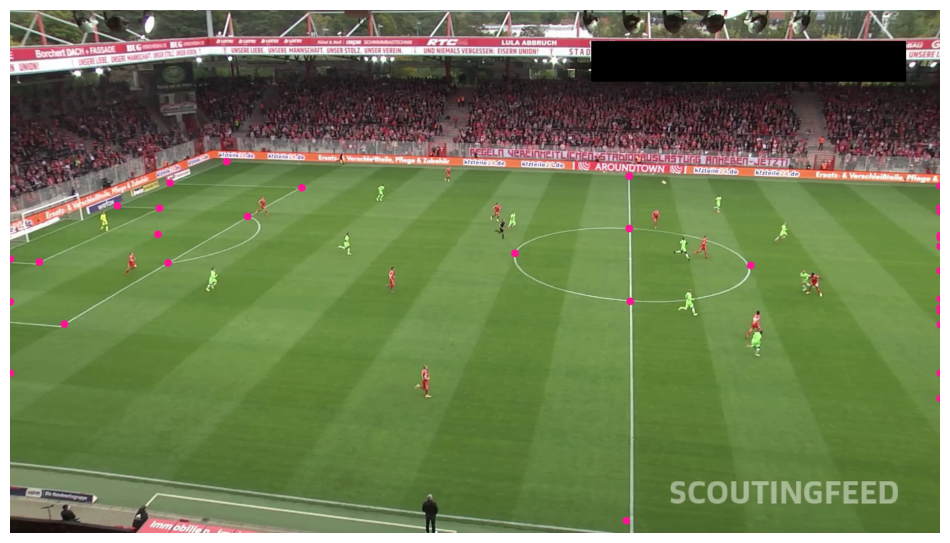

In [21]:
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8
)

frame = next(sv.get_video_frames_generator(SOURCE_VIDEO_PATH))

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(scene=annotated_frame, key_points=key_points)

sv.plot_image(annotated_frame)

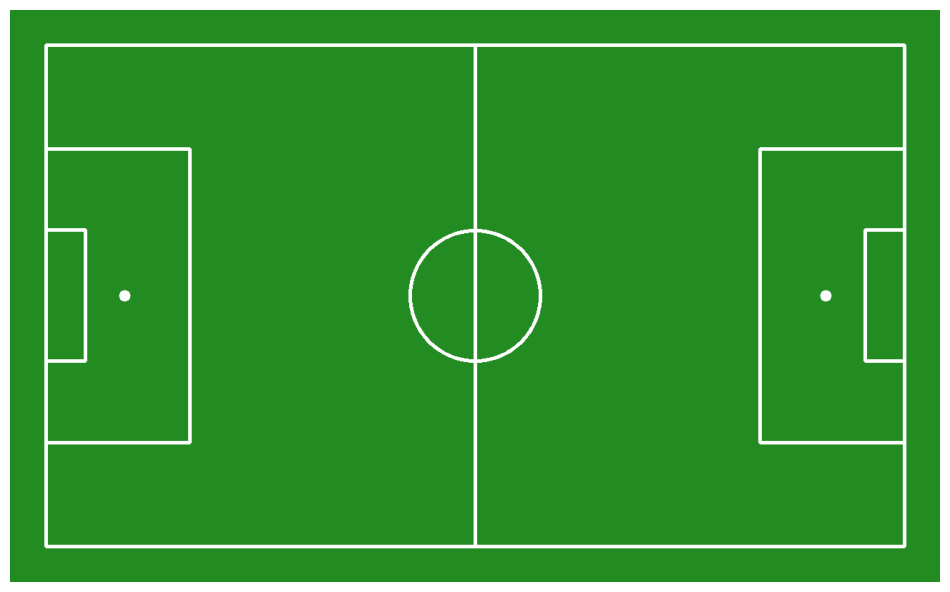

In [22]:
CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

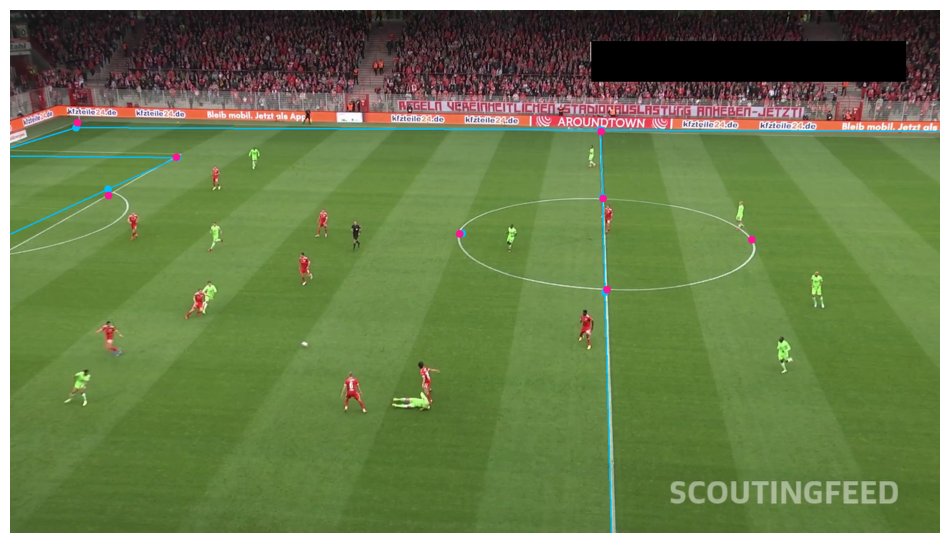

In [23]:
edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, 
    edges=CONFIG.edges
)
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8
)
vertex_annotator_2 = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8
)

frame = next(sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200))

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=pitch_reference_points,
    target=frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=pitch_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(scene=annotated_frame, key_points=frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(scene=annotated_frame, key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(scene=annotated_frame, key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

In [94]:
def homography_pitch(detections, frame):    
    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)
    
    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections = tracker.update_with_detections(detections=all_detections)
    
    goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
    players_detections = all_detections[all_detections.class_id == PLAYER_ID]
    referees_detections = all_detections[all_detections.class_id == REFEREE_ID]
    
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
    players_detections.class_id = team_classifier.predict(players_crops)
    
    goalkeepers_detections.class_id = resolve_goalkeepers_team_id(players_detections, goalkeepers_detections)
    
    referees_detections.class_id -= 1
    
    all_detections = sv.Detections.merge([players_detections, goalkeepers_detections, referees_detections])
    
    labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
    
    all_detections.class_id = all_detections.class_id.astype(int)
    
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=all_detections, labels=labels)
    annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
    
    sv.plot_image(annotated_frame)
    
    last_defender_positions = find_last_defender(players_detections)
    players_detections = sv.Detections.merge([players_detections, goalkeepers_detections])
    
    # Detect pitch key points
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)
    
    # Project ball, players and referees on pitch
    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter]
    pitch_reference_points = np.array(CONFIG.vertices)[filter]
    
    
    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
    
    players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_players_xy = transformer.transform_points(points=players_xy)
    
    referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_referees_xy = transformer.transform_points(points=referees_xy)
    
    # Visualize video game-style radar view
    annotated_frame = draw_pitch(CONFIG)
    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_ball_xy,
        face_color=sv.Color.WHITE,
        edge_color=sv.Color.BLACK,
        radius=10,
        pitch=annotated_frame
    )
    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 0],
        face_color=sv.Color.from_hex('00BFFF'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=annotated_frame
    )
    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 1],
        face_color=sv.Color.from_hex('FF1493'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=annotated_frame
    )
    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_referees_xy,
        face_color=sv.Color.from_hex('FFD700'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=annotated_frame
    )
    return annotated_frame

In [24]:
def draw_pitch_voronoi_diagram_2(
    config: SoccerPitchConfiguration,
    team_1_xy: np.ndarray,
    team_2_xy: np.ndarray,
    team_1_color: sv.Color = sv.Color.RED,
    team_2_color: sv.Color = sv.Color.WHITE,
    opacity: float = 0.5,
    padding: int = 50,
    scale: float = 0.1,
    pitch: Optional[np.ndarray] = None
) -> np.ndarray:
    """
    Draws a Voronoi diagram on a soccer pitch representing the control areas of two
    teams with smooth color transitions.

    Args:
        config (SoccerPitchConfiguration): Configuration object containing the
            dimensions and layout of the pitch.
        team_1_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 1.
        team_2_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 2.
        team_1_color (sv.Color, optional): Color representing the control area of
            team 1. Defaults to sv.Color.RED.
        team_2_color (sv.Color, optional): Color representing the control area of
            team 2. Defaults to sv.Color.WHITE.
        opacity (float, optional): Opacity of the Voronoi diagram overlay.
            Defaults to 0.5.
        padding (int, optional): Padding around the pitch in pixels.
            Defaults to 50.
        scale (float, optional): Scaling factor for the pitch dimensions.
            Defaults to 0.1.
        pitch (Optional[np.ndarray], optional): Existing pitch image to draw the
            Voronoi diagram on. If None, a new pitch will be created. Defaults to None.

    Returns:
        np.ndarray: Image of the soccer pitch with the Voronoi diagram overlay.
    """
    if pitch is None:
        pitch = draw_pitch(config=config, padding=padding, scale=scale)

    scaled_width = int(config.width * scale)
    scaled_length = int(config.length * scale)

    voronoi = np.zeros_like(pitch, dtype=np.uint8)

    team_1_color_bgr = np.array(team_1_color.as_bgr(), dtype=np.uint8)
    team_2_color_bgr = np.array(team_2_color.as_bgr(), dtype=np.uint8)

    y_coordinates, x_coordinates = np.indices((scaled_width + 2 * padding, scaled_length + 2 * padding))

    y_coordinates -= padding
    x_coordinates -= padding

    def calculate_distances(xy, x_coordinates, y_coordinates):
        return np.sqrt((xy[:, 0][:, None, None] * scale - x_coordinates) ** 2 +
                       (xy[:, 1][:, None, None] * scale - y_coordinates) ** 2)

    distances_team_1 = calculate_distances(team_1_xy, x_coordinates, y_coordinates)
    distances_team_2 = calculate_distances(team_2_xy, x_coordinates, y_coordinates)

    min_distances_team_1 = np.min(distances_team_1, axis=0)
    min_distances_team_2 = np.min(distances_team_2, axis=0)

    steepness = 15  # Sharper transition
    distance_ratio = min_distances_team_2 / np.clip(min_distances_team_1 + min_distances_team_2, a_min=1e-5, a_max=None)
    blend_factor = np.tanh((distance_ratio - 0.5) * steepness) * 0.5 + 0.5

    for c in range(3):
        voronoi[:, :, c] = (blend_factor * team_1_color_bgr[c] + (1 - blend_factor) * team_2_color_bgr[c]).astype(np.uint8)

    overlay = cv2.addWeighted(voronoi, opacity, pitch, 1 - opacity, 0)

    return overlay

Embedding extraction: 1it [00:00,  6.87it/s]


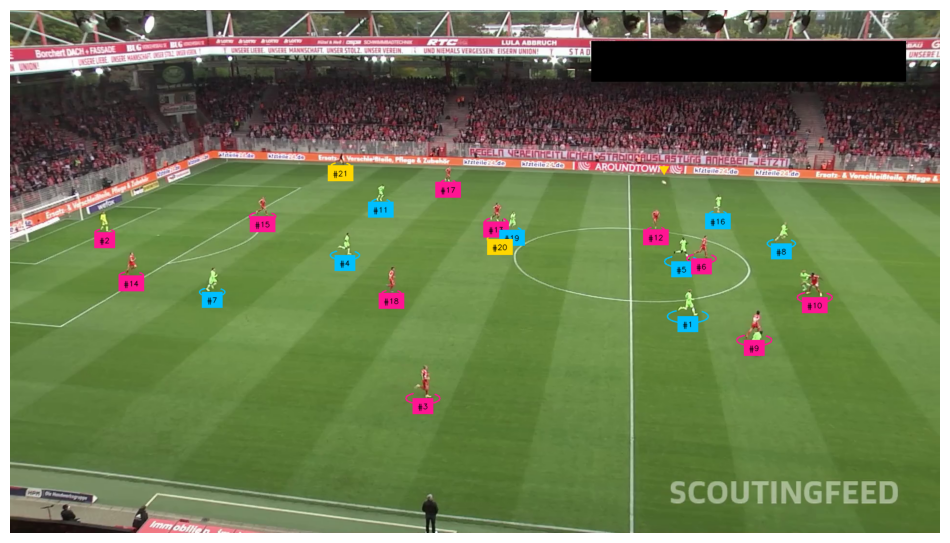

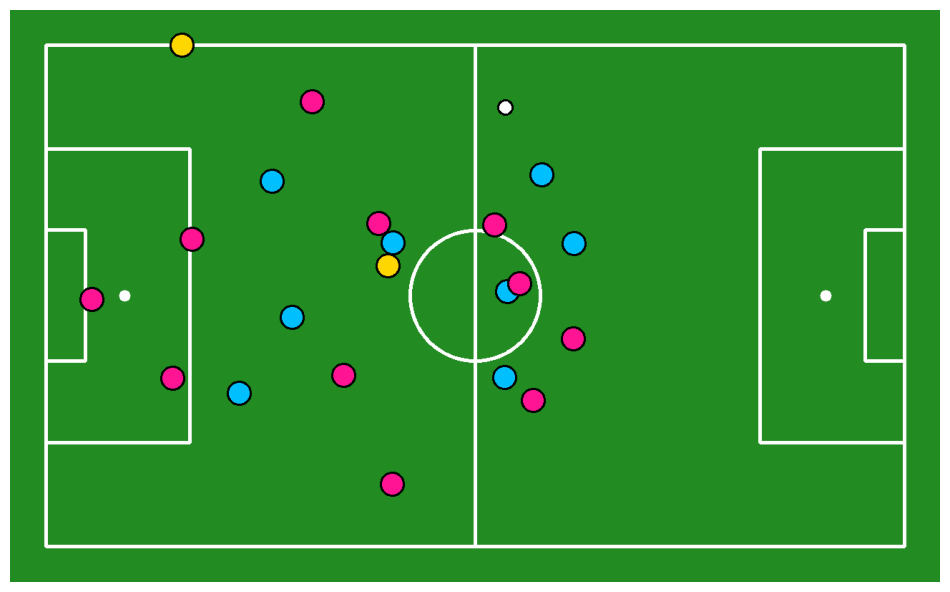

In [25]:
SOURCE_VIDEO_PATH = "/kaggle/working/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame = next(sv.get_video_frames_generator(SOURCE_VIDEO_PATH))

result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections
])

labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=all_detections, labels=labels)
annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

sv.plot_image(annotated_frame)

players_detections = sv.Detections.merge([players_detections, goalkeepers_detections])

# Detect pitch key points
result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# Project ball, players and referees on pitch
filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=frame_reference_points,
    target=pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = transformer.transform_points(points=players_xy)

referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_referees_xy = transformer.transform_points(points=referees_xy)

# Visualize video game-style radar view
annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    radius=10,
    pitch=annotated_frame
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_referees_xy,
    face_color=sv.Color.from_hex('FFD700'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame
)

sv.plot_image(annotated_frame)

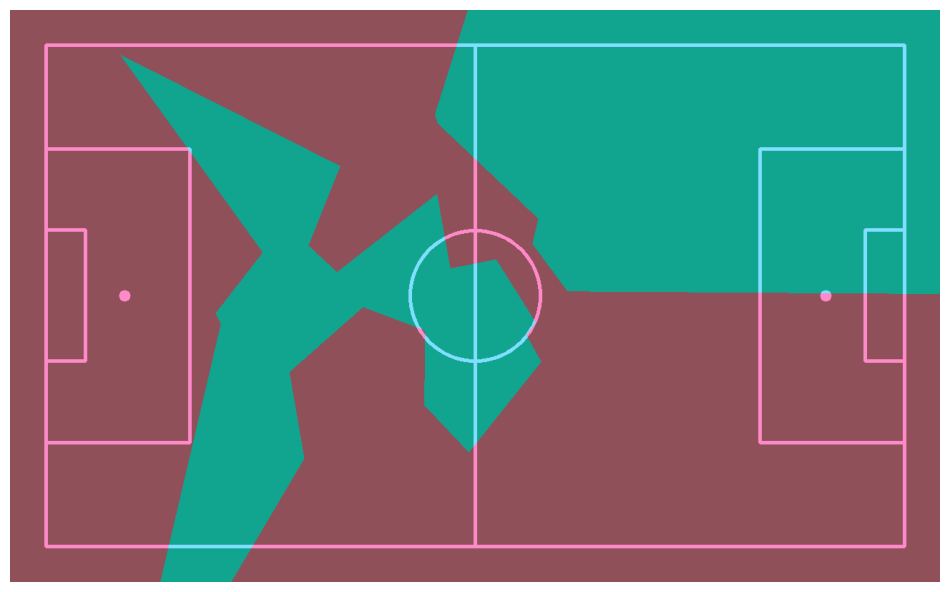

In [26]:
annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_pitch_voronoi_diagram(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame
)

sv.plot_image(annotated_frame)

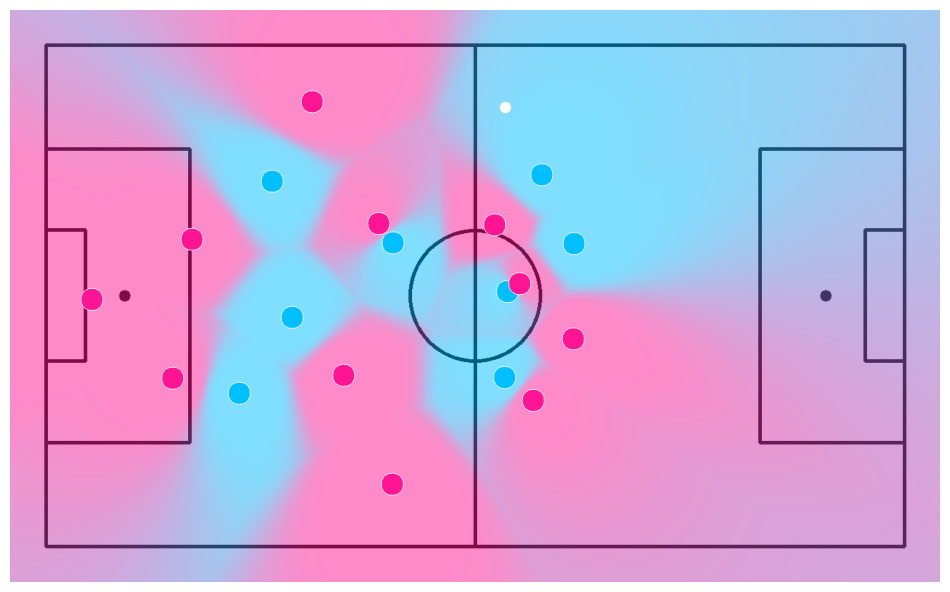

In [27]:
annotated_frame = draw_pitch(
    config=CONFIG,
    background_color=sv.Color.WHITE,
    line_color=sv.Color.BLACK
)
annotated_frame = draw_pitch_voronoi_diagram_2(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.WHITE,
    radius=8,
    thickness=1,
    pitch=annotated_frame
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame
)

sv.plot_image(annotated_frame)

In [66]:
def find_last_defender(player_detections):
# Step 1: Identify the last defenders for both teams
    last_defender = {}
    team_players_0 = players_detections[(players_detections.class_id == 0)]
    team_players_0_xy = team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_players_1 = players_detections[(players_detections.class_id == 1)]
    team_players_1_xy = team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    # Step 3: Transform coordinates to pitch space
    pitch_team0_players_xy = transformer.transform_points(points=team_players_0_xy)
    pitch_team1_players_xy = transformer.transform_points(points=team_players_1_xy)

    # Step 4: Determine the last defender for this team
    if len(pitch_team_players_xy) > 0:
        if np.mean(pitch_team0_players_xy[:, 0]) < np.mean(pitch_team1_players_xy[:, 0]):
            last_defender[0] = np.min(pitch_team0_players_xy[:, 0])
            last_defender[1] = np.max(pitch_team0_players_xy[:, 0])
            
        else:
            last_defender[0] = np.max(pitch_team0_players_xy[:, 0])
            last_defender[1] = np.min(pitch_team0_players_xy[:, 0])
    else:
        last_defender = None  # No defenders detected
    return last_defender

Embedding extraction: 1it [00:00,  6.62it/s]


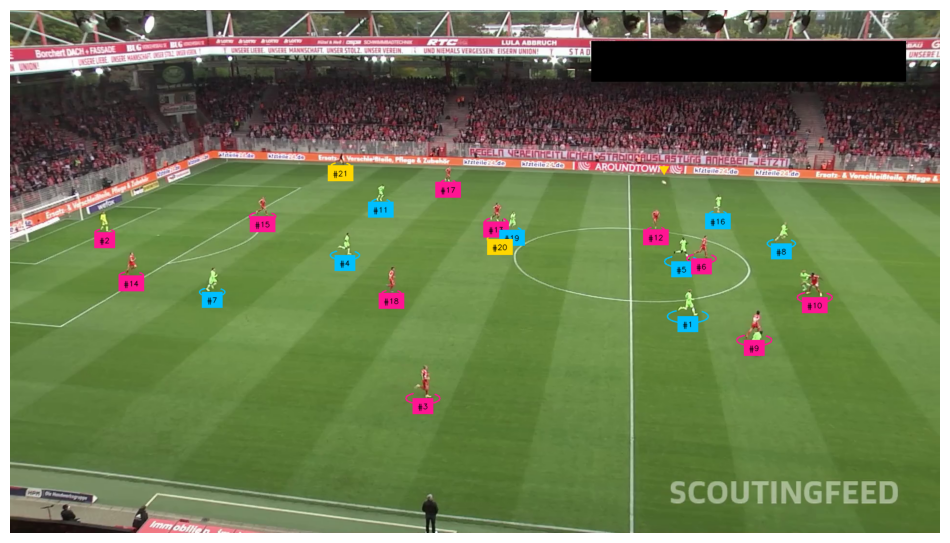

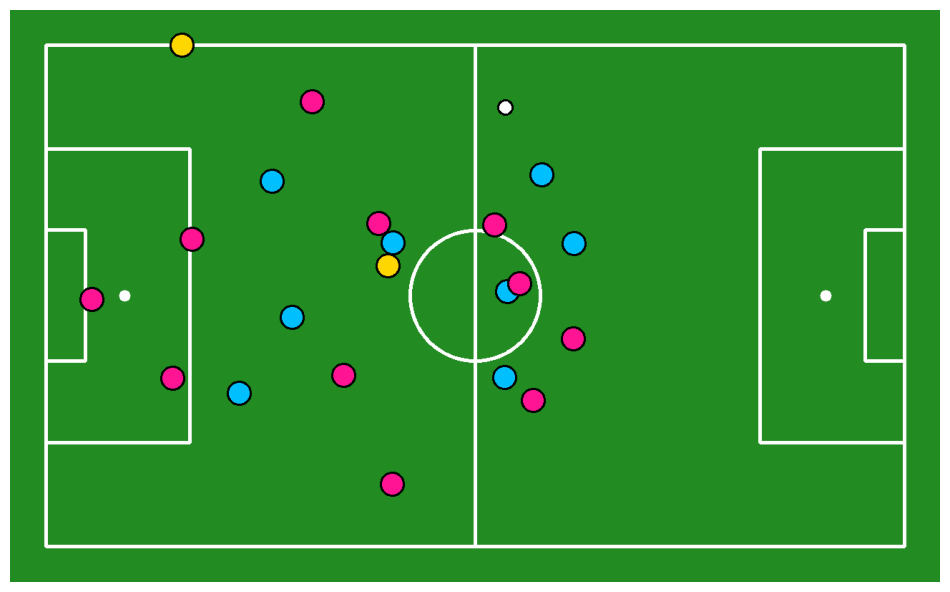

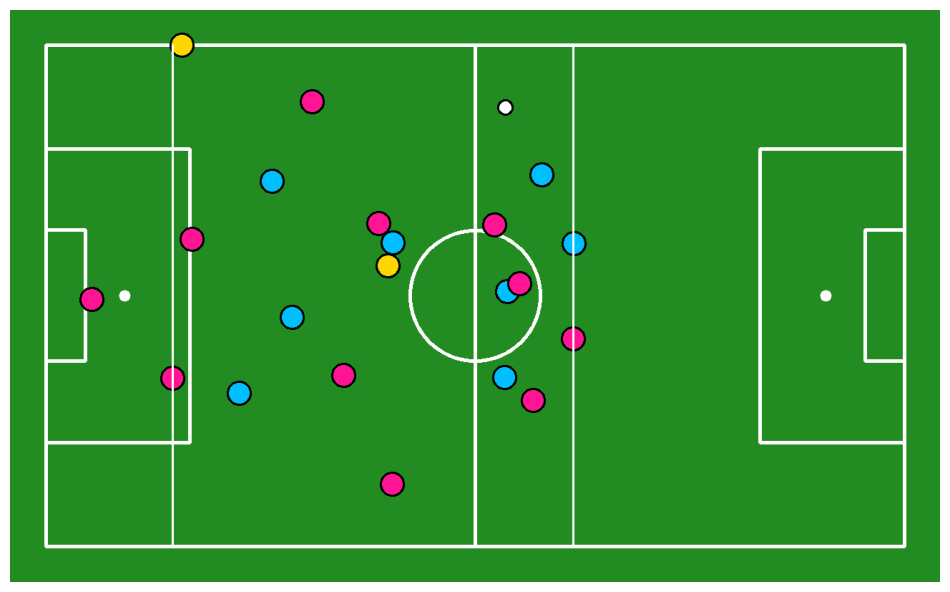

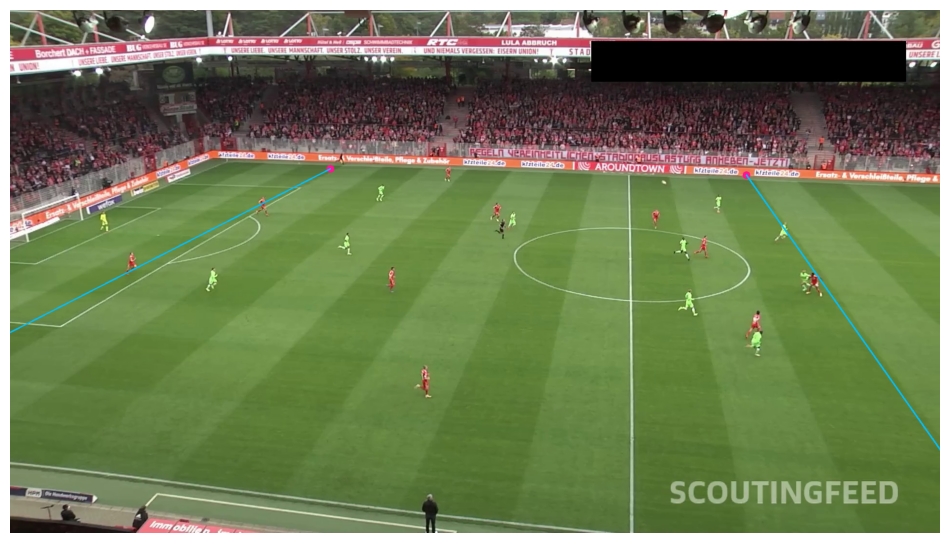

In [95]:
SOURCE_VIDEO_PATH = "/kaggle/working/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

tracker = sv.ByteTrack()
tracker.reset()

frame = next(sv.get_video_frames_generator(SOURCE_VIDEO_PATH))

result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

annotated_frame = homography_pitch(detections, frame)

sv.plot_image(annotated_frame)

x_coord = last_defender_positions[0]
vertical_line_path = np.array([
    [x_coord, 0],
    [x_coord, CONFIG.width]
])

annotated_frame = draw_paths_on_pitch(config=CONFIG, paths=[vertical_line_path], pitch=annotated_frame)
x_coord = last_defender_positions[1]

vertical_line_path = np.array([
    [x_coord, 0],
    [x_coord, CONFIG.width]
])
annotated_frame = draw_paths_on_pitch(config=CONFIG, paths=[vertical_line_path], pitch=annotated_frame)

sv.plot_image(annotated_frame)

offside_points = np.array([[last_defender_positions[0],0],
                           [last_defender_positions[0], CONFIG.width],
                           [last_defender_positions[1],0],
                           [last_defender_positions[1], CONFIG.width]])

frame_coordinates = transformer_inverse.transform_points(points=offside_points)
key_points = sv.KeyPoints(xy=frame_coordinates[np.newaxis, ...])

edges = [(0, 3), (1, 2)]
edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, 
    edges=edges
)

annotated_frame = vertex_annotator.annotate(scene=frame, key_points=key_points)
annotated_frame = edge_annotator.annotate(scene=frame, key_points=key_points)

sv.plot_image(annotated_frame)

Embedding extraction: 1it [00:00,  6.74it/s]


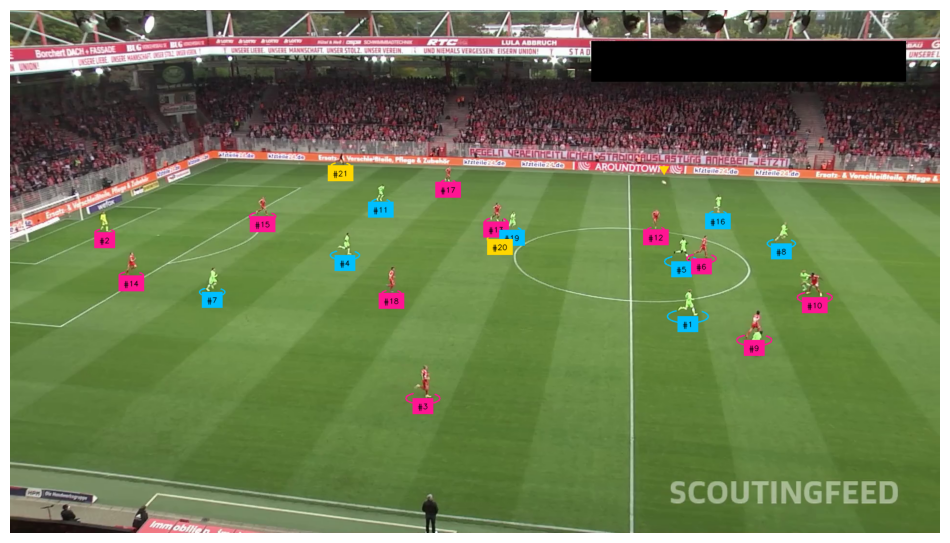

dugvrugvug: {0: 7374.2104, 1: 1777.943}
Team 0 - Last defender x-coordinate (frame space): 1592
Team 1 - Last defender x-coordinate (frame space): 250


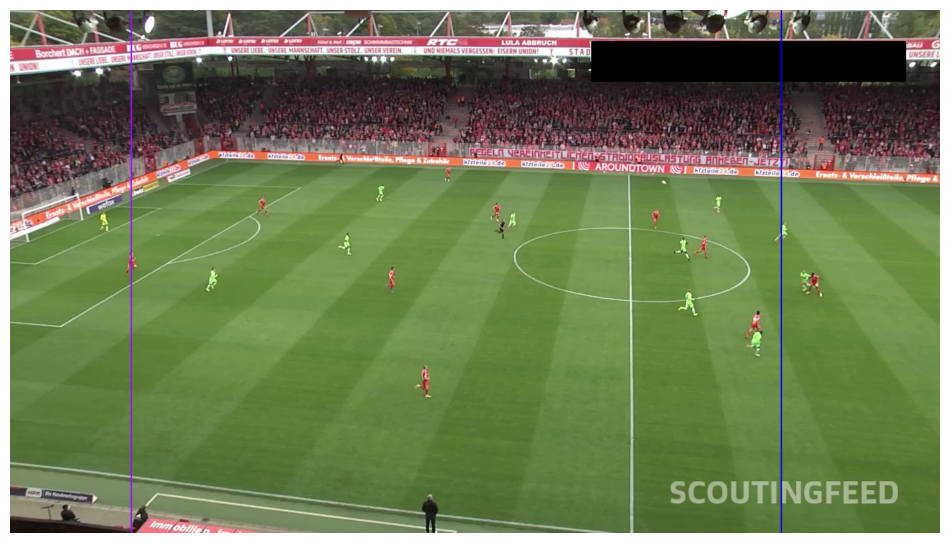

In [67]:
SOURCE_VIDEO_PATH = "/kaggle/working/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ball, goalkeeper, player, referee detection

result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

people_detections = detections[detections.class_id != BALL_ID]
people_detections = people_detections.with_nms(threshold=0.5, class_agnostic=True)
people_detections = tracker.update_with_detections(detections=people_detections)

goalkeepers_detections = people_detections[people_detections.class_id == GOALKEEPER_ID]
players_detections = people_detections[people_detections.class_id == PLAYER_ID]
referees_detections = people_detections[people_detections.class_id == REFEREE_ID]

# team assignment

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

# frame visualization

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

all_players_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections
])

# detect pitch key points

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# project ball, players and referies on pitch

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]


last_defender_positions = find_last_defender(players_detections)
print("dugvrugvug: "+str(last_defender_positions))

# Draw a vertical offside line directly on the camera image using frame coordinates
team_colors = {
    0: (255, 0, 0),    # Blue for Team 0
    1: (255, 20, 147)  # Pink for Team 1
}

# Use the original frame for drawing
annotated_frame_direct = frame.copy()
height, width = annotated_frame_direct.shape[:2]

for team_id in [0, 1]:
    # Get team players (in frame coordinates)
    team_players = players_detections[players_detections.class_id == team_id]
    
    if len(team_players.xyxy) > 0:
        # Get the bottom center coordinates for each player in the team
        frame_players_xy = team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        
        # For debugging, decide the last defender by:
        # For Team 0: use the maximum x-coordinate (rightmost player)
        # For Team 1: use the minimum x-coordinate (leftmost player)
        if team_id == 0:
            frame_x = int(np.max(frame_players_xy[:, 0]))
        else:
            frame_x = int(np.min(frame_players_xy[:, 0]))
        
        # Draw a vertical line at this x-coordinate on the camera image
        cv2.line(annotated_frame_direct, (frame_x, 0), (frame_x, height), color=team_colors[team_id], thickness=2)
        print(f"Team {team_id} - Last defender x-coordinate (frame space): {frame_x}")

# Display the updated frame
sv.plot_image(annotated_frame_direct)

In [28]:
import numpy as np
import cv2

def compute_vanishing_point(lines):
    """
    lines: list of lines, each line = (x1, y1, x2, y2)
           in your image/camera coordinate system.
    Returns a single (vx, vy) or None if not found.
    """
    points = []
    for i in range(len(lines)):
        x1, y1, x2, y2 = lines[i]
        for j in range(i+1, len(lines)):
            x3, y3, x4, y4 = lines[j]
            # Solve for intersection
            denom = (x1 - x2)*(y3 - y4) - (y1 - y2)*(x3 - x4)
            if abs(denom) < 1e-6:
                # lines are parallel or nearly parallel, skip
                continue
            intersect_x = ((x1*y2 - y1*x2)*(x3 - x4) - 
                           (x1 - x2)*(x3*y4 - y3*x4)) / denom
            intersect_y = ((x1*y2 - y1*x2)*(y3 - y4) -
                           (y1 - y2)*(x3*y4 - y3*x4)) / denom
            points.append([intersect_x, intersect_y])
    if len(points) == 0:
        return None
    # Average all intersection points
    vx, vy = np.mean(points, axis=0)
    return vx, vy


In [29]:
import numpy as np
import cv2

def compute_vanishing_point(lines):
    """
    lines: list of lines, each line = (x1, y1, x2, y2)
           in your image/camera coordinate system.
    Returns a single (vx, vy) or None if not found.
    """
    points = []
    for i in range(len(lines)):
        x1, y1, x2, y2 = lines[i]
        for j in range(i+1, len(lines)):
            x3, y3, x4, y4 = lines[j]
            # Solve for intersection
            denom = (x1 - x2)*(y3 - y4) - (y1 - y2)*(x3 - x4)
            if abs(denom) < 1e-6:
                # lines are parallel or nearly parallel, skip
                continue
            intersect_x = ((x1*y2 - y1*x2)*(x3 - x4) - 
                           (x1 - x2)*(x3*y4 - y3*x4)) / denom
            intersect_y = ((x1*y2 - y1*x2)*(y3 - y4) -
                           (y1 - y2)*(x3*y4 - y3*x4)) / denom
            points.append([intersect_x, intersect_y])
    if len(points) == 0:
        return None
    # Average all intersection points
    vx, vy = np.mean(points, axis=0)
    return vx, vy


In [30]:
def draw_line_through_point_and_vanishing_point(
    frame: np.ndarray,
    point: tuple[float, float],
    vanish: tuple[float, float],
    color=(0, 255, 0),
    thickness=2
):
    """
    Draws a line in `frame` that goes through `point` and
    is parallel to the lines that share the same vanishing point `vanish`.
    """
    h, w = frame.shape[:2]
    x_d, y_d = point
    x_v, y_v = vanish

    # Parametric form: (x, y) = (x_d, y_d) + t * ((x_v - x_d), (y_v - y_d))
    # We'll pick two large t values to ensure we go beyond the frame,
    # then clip if desired.
    big_t = 999999  # "far" in both directions
    pt1 = (int(x_d + -big_t*(x_v - x_d)), int(y_d + -big_t*(y_v - y_d)))
    pt2 = (int(x_d +  big_t*(x_v - x_d)), int(y_d +  big_t*(y_v - y_d)))

    cv2.line(frame, pt1, pt2, color, thickness)


Embedding extraction: 1it [00:00,  6.90it/s]


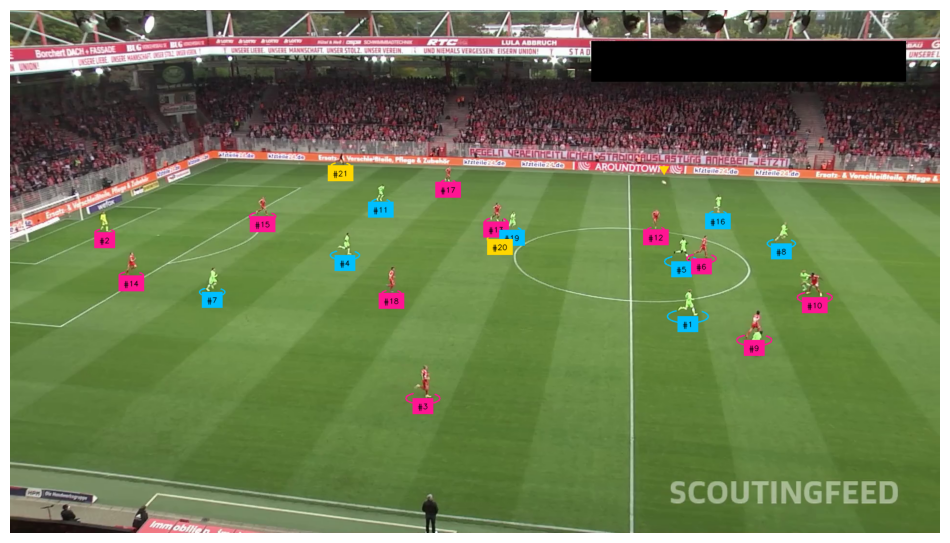

Team 0 - Last defender x-coordinate (frame space): 1592
Team 1 - Last defender x-coordinate (frame space): 250


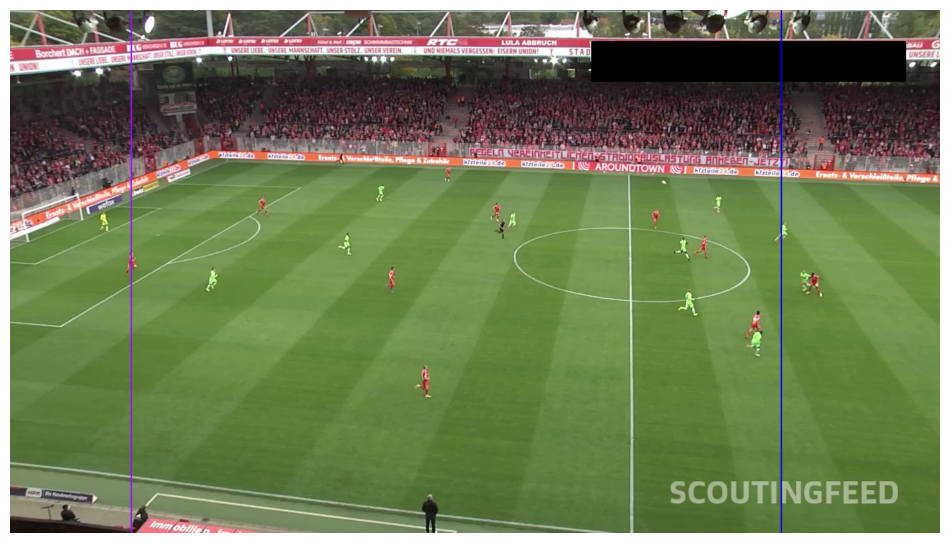

Team 0 - Offside line drawn between (618, 322) and (572, 347)
Team 1 - Offside line drawn between (618, 322) and (572, 347)


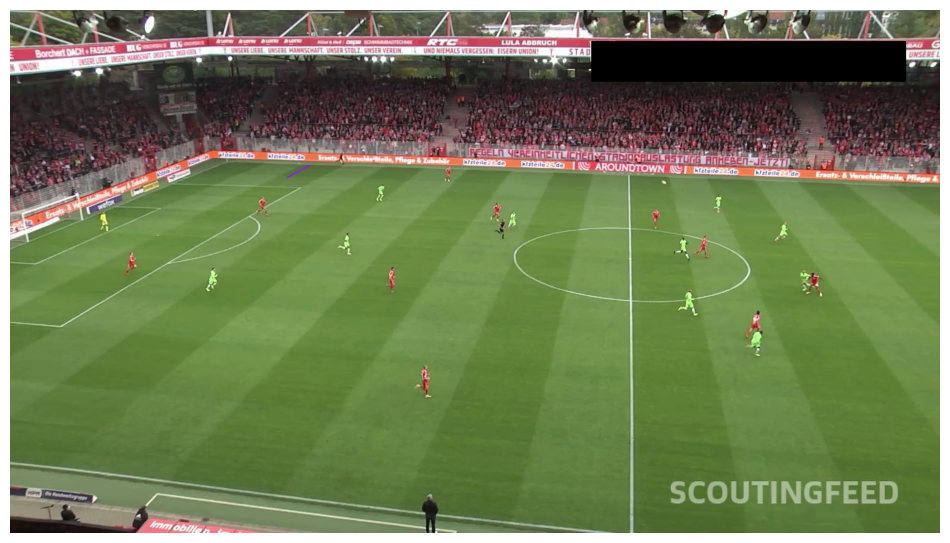

In [39]:
SOURCE_VIDEO_PATH = "/kaggle/working/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ball, goalkeeper, player, referee detection

result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# team assignment

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

# frame visualization

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

all_players_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections
])

# detect pitch key points

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# project ball, players and referies on pitch

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]



# Step 1: Identify the last defenders for both teams
last_defender_x_positions = {}

for team_id in [0, 1]:  # Process both teams
    # Step 2: Get all players from the team (excluding goalkeepers)
    team_players = players_detections[(players_detections.class_id == team_id)]
    team_players_xy = team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)

    # Step 3: Transform coordinates to pitch space
    pitch_all_players_xy = transformer.transform_points(points=team_players_xy)

    # Step 4: Determine the last defender for this team
    if len(pitch_all_players_xy) > 0:
        pitch_width = np.max(pitch_all_players_xy[:, 0]) - np.min(pitch_all_players_xy[:, 0])  # Get pitch width

        if np.mean(pitch_all_players_xy[:, 0]) < pitch_width / 2:
            last_defender_x = np.max(pitch_team_players_xy[:, 0])  # Rightmost defender
        else:
            last_defender_x = np.min(pitch_team_players_xy[:, 0])  # Leftmost defender

        last_defender_x_positions[team_id] = last_defender_x
    else:
        last_defender_x_positions[team_id] = None  # No defenders detected

# Draw a vertical offside line directly on the camera image using frame coordinates
team_colors = {
    0: (255, 0, 0),    # Blue for Team 0
    1: (255, 20, 147)  # Pink for Team 1
}

# Use the original frame for drawing
annotated_frame_direct = frame.copy()
height, width = annotated_frame_direct.shape[:2]

for team_id in [0, 1]:
    # Get team players (in frame coordinates)
    team_players = players_detections[players_detections.class_id == team_id]
    
    if len(team_players.xyxy) > 0:
        # Get the bottom center coordinates for each player in the team
        frame_players_xy = team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        
        # For debugging, decide the last defender by:
        # For Team 0: use the maximum x-coordinate (rightmost player)
        # For Team 1: use the minimum x-coordinate (leftmost player)
        if team_id == 0:
            frame_x = int(np.max(frame_players_xy[:, 0]))
        else:
            frame_x = int(np.min(frame_players_xy[:, 0]))
        
        # Draw a vertical line at this x-coordinate on the camera image
        cv2.line(annotated_frame_direct, (frame_x, 0), (frame_x, height), color=team_colors[team_id], thickness=2)
        print(f"Team {team_id} - Last defender x-coordinate (frame space): {frame_x}")

# Display the updated frame
sv.plot_image(annotated_frame_direct)
# First, get a top‐down pitch image so we can know its height.
pitch_img = draw_pitch(CONFIG)
pitch_height = pitch_img.shape[0]

# Use the previously computed last_defender_x_positions (in pitch space)
# Here, last_defender_x_positions[team_id] is the offside line's x-value in pitch coordinates.
team_colors = {
    0: (255, 0, 0),    # Blue for Team 0
    1: (255, 20, 147)  # Pink for Team 1
}

# Make a copy of the original frame for drawing
annotated_frame_pitch_line = frame.copy()

# For each team, if a last defender was detected:
for team_id in [0, 1]:
    last_defender_x = last_defender_x_positions.get(team_id)
    if last_defender_x is not None:
        # Define two endpoints in pitch space: top and bottom of the pitch
        # (Assuming the pitch's y-dimension is [0, pitch_height])
        pitch_line_points = np.array([
            [[last_defender_x, 0]],
            [[last_defender_x, pitch_height]]
        ], dtype=np.float32)
        
        # To project from pitch space back to the frame, compute the inverse transform.
        inverse_m = np.linalg.inv(transformer.m)
        frame_line_points = cv2.perspectiveTransform(pitch_line_points, inverse_m)
        
        # Extract endpoints (rounded to integer pixel coordinates)
        pt1 = (int(frame_line_points[0, 0, 0]), int(frame_line_points[0, 0, 1]))
        pt2 = (int(frame_line_points[1, 0, 0]), int(frame_line_points[1, 0, 1]))
        
        # Draw the line on the frame
        cv2.line(annotated_frame_pitch_line, pt1, pt2, color=team_colors[team_id], thickness=2)
        print(f"Team {team_id} - Offside line drawn between {pt1} and {pt2}")

# Display the resulting frame with the projected offside line
sv.plot_image(annotated_frame_pitch_line)


Embedding extraction: 1it [00:00,  6.81it/s]


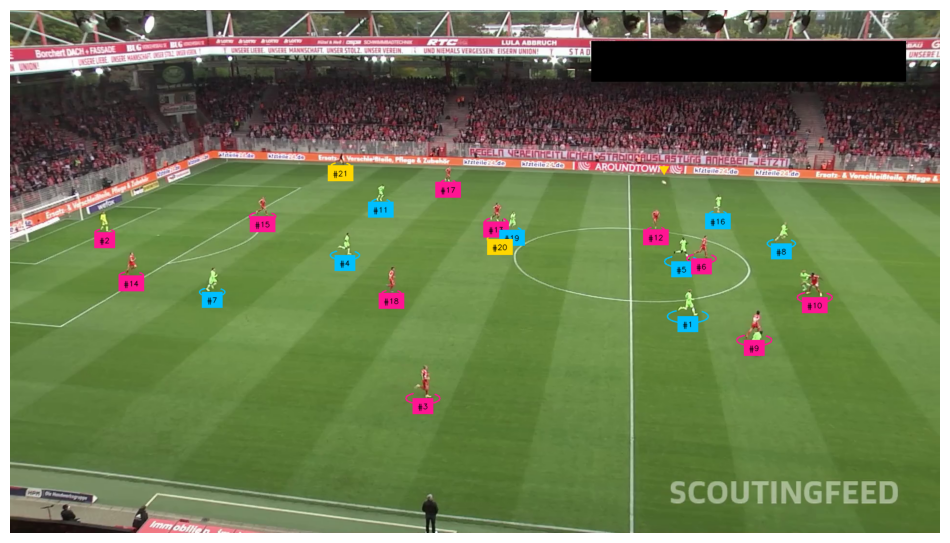

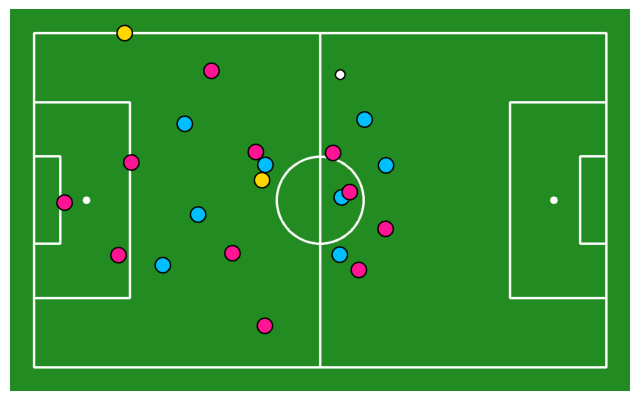

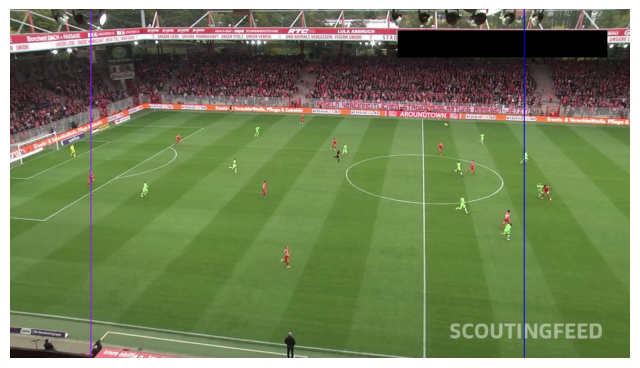

Team 0 offside line: from (1592.5, 483.0) to vanishing (1410.8, 172.0)
Team 1 offside line: from (1661.0, 594.0) to vanishing (1410.8, 172.0)


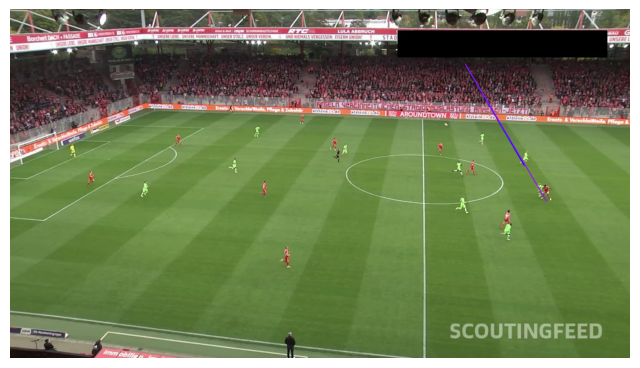

In [41]:
import cv2
import numpy as np
import supervision as sv

# ---------------------------------------------------------------------
# REQUIRED CUSTOM FUNCTIONS / CLASSES (must already exist in your env):
#   - DETECTION_MODEL.infer
#   - FIELD_DETECTION_MODEL.infer
#   - team_classifier.predict
#   - resolve_goalkeepers_team_id
#   - CONFIG (pitch config)
#   - ViewTransformer
#   - draw_pitch
#   - draw_points_on_pitch
# ---------------------------------------------------------------------

SOURCE_VIDEO_PATH = "/kaggle/working/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Example ellipse, label, and triangle annotators (Supervision style)
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

# ByteTrack instance
tracker = sv.ByteTrack()
tracker.reset()

# Read first frame from video
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ---------------------------------------------------------------------
# 1) DETECT BALL, GOALKEEPER, PLAYER, REFEREE
# ---------------------------------------------------------------------
result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# Isolate ball detections, enlarge bounding box slightly
ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

# All other detections (player, goalkeeper, referee)
all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# ---------------------------------------------------------------------
# 2) TEAM ASSIGNMENT
# ---------------------------------------------------------------------
players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
# Use your custom classifier to differentiate Team 0 vs Team 1
players_detections.class_id = team_classifier.predict(players_crops)

# Resolve goalkeeper team based on known logic
goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections
)

# Subtract 1 for referees so they don't mix with teams 0/1
referees_detections.class_id -= 1

# Merge back
all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections
])

# ---------------------------------------------------------------------
# 3) VISUALIZE DETECTIONS (ELLIPSES, LABELS, BALL)
# ---------------------------------------------------------------------
labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections
)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels
)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections
)

# Just to show the initial detection result
sv.plot_image(annotated_frame)

# ---------------------------------------------------------------------
# 4) PREPARE PLAYER + GOALKEEPER DETECTIONS FOR OFFSIDE ANALYSIS
# ---------------------------------------------------------------------
all_players_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections
])

# ---------------------------------------------------------------------
# 5) DETECT PITCH KEYPOINTS + PROJECT TO PITCH SPACE
# ---------------------------------------------------------------------
result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter_ = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter_]
pitch_reference_points = np.array(CONFIG.vertices)[filter_]

# Create perspective transformer (frame -> pitch)
transformer = ViewTransformer(
    source=frame_reference_points,
    target=pitch_reference_points
)

# Transform ball to pitch coordinates
frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

# Transform all players to pitch coordinates
all_players_xy = all_players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_all_players_xy = transformer.transform_points(points=all_players_xy)

# Transform referees
referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_referees_xy = transformer.transform_points(points=referees_xy)

# ---------------------------------------------------------------------
# 6) VISUALIZE A "RADAR VIEW" (TOP‐DOWN PITCH)
# ---------------------------------------------------------------------
annotated_pitch = draw_pitch(CONFIG)
annotated_pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    radius=10,
    pitch=annotated_pitch
)
annotated_pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_all_players_xy[all_players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_pitch
)
annotated_pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_all_players_xy[all_players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_pitch
)
annotated_pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_referees_xy,
    face_color=sv.Color.from_hex('FFD700'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_pitch
)

sv.plot_image(annotated_pitch, size=(8, 6))

# ---------------------------------------------------------------------
# 7) FIND LAST DEFENDER (IN PITCH SPACE) FOR EACH TEAM
# ---------------------------------------------------------------------
last_defender_x_positions = {}
for team_id in [0, 1]:
    # Get all players from the team (excluding referees)
    team_players = players_detections[players_detections.class_id == team_id]
    team_players_xy = team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_team_players_xy = transformer.transform_points(points=team_players_xy)

    if len(pitch_team_players_xy) > 0:
        # Approx. pitch width from overall players
        pitch_width = np.max(pitch_all_players_xy[:, 0]) - np.min(pitch_all_players_xy[:, 0])

        # Decide if team is on left side or right side
        if np.mean(pitch_team_players_xy[:, 0]) < pitch_width / 2:
            # Team is on the left half → last defender is the rightmost
            last_defender_x = np.min(pitch_team_players_xy[:, 0])
        else:
            # Team is on the right half → last defender is the leftmost
            last_defender_x = np.max(pitch_team_players_xy[:, 0])

        last_defender_x_positions[team_id] = last_defender_x
    else:
        last_defender_x_positions[team_id] = None  # No defenders

# ---------------------------------------------------------------------
# 8) (OPTIONAL) DRAW VERTICAL LINE (FOR DEBUGGING) - not truly oriented
# ---------------------------------------------------------------------
# You had this approach before; we keep it here for reference, but the real
# oriented line is drawn below using the vanishing point logic.
team_colors = {
    0: (255, 0, 0),    # Blue for Team 0
    1: (255, 20, 147)  # Pink for Team 1
}

annotated_frame_direct = frame.copy()
height, width = annotated_frame_direct.shape[:2]

for team_id in [0, 1]:
    team_players = players_detections[players_detections.class_id == team_id]
    if len(team_players.xyxy) > 0:
        frame_players_xy = team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        if team_id == 0:
            frame_x = int(np.max(frame_players_xy[:, 0]))
        else:
            frame_x = int(np.min(frame_players_xy[:, 0]))

        cv2.line(
            annotated_frame_direct,
            (frame_x, 0),
            (frame_x, height),
            color=team_colors[team_id],
            thickness=2
        )

sv.plot_image(annotated_frame_direct, size=(8, 6))

# ---------------------------------------------------------------------
# 9) DETECT LINES ON THE PITCH (CANNY + HOUGH) TO FIND VANISHING POINT
# ---------------------------------------------------------------------
def line_intersection(line1, line2):
    """
    Return the intersection (x, y) of two lines each defined by
    (x1, y1, x2, y2). If parallel or no intersection, return None.
    """
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2

    denom = (x1 - x2) * (y3 - y4) - (y1 - y2) * (x3 - x4)
    if abs(denom) < 1e-10:
        return None  # Parallel or extremely close to parallel

    intersect_x = ((x1*y2 - y1*x2)*(x3 - x4) - (x1 - x2)*(x3*y4 - y3*x4)) / denom
    intersect_y = ((x1*y2 - y1*x2)*(y3 - y4) - (y1 - y2)*(x3*y4 - y3*x4)) / denom
    return (intersect_x, intersect_y)

def find_vanishing_point(frame):
    """
    1) Convert to grayscale
    2) Detect edges (Canny)
    3) Detect lines (HoughLinesP)
    4) Compute all pairwise intersections
    5) Return average intersection
    """
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 80, 200)  # You can tune these thresholds

    lines_p = cv2.HoughLinesP(
        edges,
        rho=1,
        theta=np.pi/180,
        threshold=100,
        minLineLength=80,
        maxLineGap=50
    )
    if lines_p is None:
        return None

    lines_p = lines_p[:, 0]  # shape (N, 4)
    intersections = []
    n_lines = len(lines_p)

    # Find all pairwise intersections among the lines
    for i in range(n_lines):
        for j in range(i+1, n_lines):
            pt = line_intersection(lines_p[i], lines_p[j])
            if pt is not None:
                # Filter out intersections that are obviously off‐image
                if (0 <= pt[0] < frame.shape[1]*2) and (0 <= pt[1] < frame.shape[0]*2):
                    intersections.append(pt)

    if len(intersections) == 0:
        return None

    # Average intersection
    arr = np.array(intersections)
    mean_x = np.mean(arr[:, 0])
    mean_y = np.mean(arr[:, 1])
    return (mean_x, mean_y)

vanishing_pt = find_vanishing_point(frame.copy())

# ---------------------------------------------------------------------
# 10) DRAW ORIENTED OFFSIDE LINES (LAST DEFENDER ↔ VANISHING POINT)
# ---------------------------------------------------------------------
annotated_frame_pitch_line = frame.copy()

# We also need pitch height in real scale for projecting back:
pitch_img = draw_pitch(CONFIG)
pitch_height = pitch_img.shape[0]

# If we found a vanishing point:
if vanishing_pt is not None:
    vx, vy = vanishing_pt

    # For each team, if a last defender was detected in pitch space
    for team_id in [0, 1]:
        last_defender_x = last_defender_x_positions.get(team_id)
        if last_defender_x is not None:
            # We'll define a line in pitch space from (last_defender_x, 0)
            # to (last_defender_x, pitch_height). That line is typically vertical.
            # But we want to re‐orient it to pass through the vanishing point
            # in the IMAGE frame. So let's do it in the image frame:

            # 1) Get the last defender's bottom‐center in frame coords:
            team_players = players_detections[players_detections.class_id == team_id]
            pitch_team_players_xy = transformer.transform_points(
                points=team_players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
            )

            # Identify which actual player is the "last defender" in pitch space
            # We pick the one whose pitch X = last_defender_x
            # (some tolerance in case of float comparisons)
            idx = np.where(np.isclose(pitch_team_players_xy[:, 0], last_defender_x, atol=1e-2))[0]
            if len(idx) == 0:
                # fallback: no exact match, just skip
                continue

            # We'll just take the first that matches
            last_def_idx = idx[0]
            # Convert that pitch coordinate back to frame space
            pitch_pt = np.array([[pitch_team_players_xy[last_def_idx]]], dtype=np.float32)
            inverse_m = np.linalg.inv(transformer.m)
            frame_pt = cv2.perspectiveTransform(pitch_pt, inverse_m)
            lx, ly = frame_pt[0, 0, 0], frame_pt[0, 0, 1]

            # 2) Now draw a line from (lx, ly) to the vanishing point (vx, vy).
            # Because the vanishing point can be far away, we can extend the line
            # so it spans the entire frame.
            # We'll parametric‐extend from (lx, ly) <-> (vx, vy).
            # For simplicity, let's just draw that finite segment:
            cv2.line(
                annotated_frame_pitch_line,
                (int(lx), int(ly)),
                (int(vx), int(vy)),
                color=team_colors[team_id],
                thickness=2
            )
            print(f"Team {team_id} offside line: from ({lx:.1f}, {ly:.1f}) to vanishing ({vx:.1f}, {vy:.1f})")

# Show the final result
sv.plot_image(annotated_frame_pitch_line, size=(8, 6))


In [ ]:
# Creates final video output
OUTPUT_VIDEO_PATH = "output_video.mp4"
TARGET_VIDEO_PATH = "result5.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

CONFIG = SoccerPitchConfiguration()

pitch_frame = draw_pitch(CONFIG)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
fps = 30
frame_height, frame_width = pitch_frame.shape[:2]
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_sink1 = sv.VideoSink("/kaggle/working/sink1.mp4", video_info=video_info)
video_writer1 = cv2.VideoWriter('/kaggle/working/output_video1.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))
video_writer2 = cv2.VideoWriter('/kaggle/working/output_video2.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))
video_writer3 = cv2.VideoWriter('/kaggle/working/output_video3.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

with video_sink1:
    for frame in tqdm(frame_generator, total=video_info.total_frames):
        result = DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)
        
        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)
        
        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections = tracker.update_with_detections(detections=all_detections)
        
        goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
        players_detections = all_detections[all_detections.class_id == PLAYER_ID]
        referees_detections = all_detections[all_detections.class_id == REFEREE_ID]
        
        players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
        players_detections.class_id = team_classifier.predict(players_crops)
        
        goalkeepers_detections.class_id = resolve_goalkeepers_team_id(players_detections, goalkeepers_detections)
        
        referees_detections.class_id -= 1
        
        all_detections = sv.Detections.merge([
            players_detections, goalkeepers_detections, referees_detections
        ])
        
        labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
        all_detections.class_id = all_detections.class_id.astype(int)
        
        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
        annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=all_detections, labels=labels)
        annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
        
        video_sink1.write_frame(annotated_frame)
        
        players_detections = sv.Detections.merge([players_detections, goalkeepers_detections])
        
        result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        key_points = sv.KeyPoints.from_inference(result)
        
        filter = key_points.confidence[0] > 0.5
        frame_reference_points = key_points.xy[0][filter]
        pitch_reference_points = np.array(CONFIG.vertices)[filter]
        
        transformer = ViewTransformer(
            source=frame_reference_points,
            target=pitch_reference_points
        )
        
        frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
        
        players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        pitch_players_xy = transformer.transform_points(points=players_xy)
        
        referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        pitch_referees_xy = transformer.transform_points(points=referees_xy)
        
        annotated_frame = draw_pitch(CONFIG)
        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_ball_xy,
            face_color=sv.Color.WHITE,
            edge_color=sv.Color.BLACK,
            radius=10,
            pitch=annotated_frame
        )
        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_players_xy[players_detections.class_id == 0],
            face_color=sv.Color.from_hex('00BFFF'),
            edge_color=sv.Color.BLACK,
            radius=16,
            pitch=annotated_frame
        )
        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_players_xy[players_detections.class_id == 1],
            face_color=sv.Color.from_hex('FF1493'),
            edge_color=sv.Color.BLACK,
            radius=16,
            pitch=annotated_frame
        )
        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_referees_xy,
            face_color=sv.Color.from_hex('FFD700'),
            edge_color=sv.Color.BLACK,
            radius=16,
            pitch=annotated_frame
        )
        
        video_writer1.write(annotated_frame)
        
        annotated_frame = draw_pitch(CONFIG)
        annotated_frame = draw_pitch_voronoi_diagram(
            config=CONFIG,
            team_1_xy=pitch_players_xy[players_detections.class_id == 0],
            team_2_xy=pitch_players_xy[players_detections.class_id == 1],
            team_1_color=sv.Color.from_hex('00BFFF'),
            team_2_color=sv.Color.from_hex('FF1493'),
            pitch=annotated_frame
        )
        video_writer2.write(annotated_frame)
        
        annotated_frame = draw_pitch(
            config=CONFIG,
            background_color=sv.Color.WHITE,
            line_color=sv.Color.BLACK
        )
        annotated_frame = draw_pitch_voronoi_diagram_2(
            config=CONFIG,
            team_1_xy=pitch_players_xy[players_detections.class_id == 0],
            team_2_xy=pitch_players_xy[players_detections.class_id == 1],
            team_1_color=sv.Color.from_hex('00BFFF'),
            team_2_color=sv.Color.from_hex('FF1493'),
            pitch=annotated_frame
        )
        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_ball_xy,
            face_color=sv.Color.WHITE,
            edge_color=sv.Color.WHITE,
            radius=8,
            thickness=1,
            pitch=annotated_frame
        )
        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_players_xy[players_detections.class_id == 0],
            face_color=sv.Color.from_hex('00BFFF'),
            edge_color=sv.Color.WHITE,
            radius=16,
            thickness=1,
            pitch=annotated_frame
        )
        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_players_xy[players_detections.class_id == 1],
            face_color=sv.Color.from_hex('FF1493'),
            edge_color=sv.Color.WHITE,
            radius=16,
            thickness=1,
            pitch=annotated_frame
        )
        
        video_writer3.write(annotated_frame)

video_writer1.release()
video_writer2.release()
video_writer3.release()